In [1]:
%load_ext autoreload
%autoreload 2

import anndata
import logging
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import pickle
import scanpy as sc
import scipy
import seaborn as sns
from sklearn import decomposition
import time
import warnings
import umap

import sfaira

usr = !echo $USER
base_path = '.'
base_path_out = '.'

grid_search_dir = '.'
datadir = '.'
targetpath = '.'
configpath = '.'
outdir = base_path_out + '/results/'
figdir = outdir+'/figures/'

sc.logging.print_version_and_date()
sc.settings.verbosity = 0
sc.settings.figdir = figdir

Ontology <class 'sfaira.versions.metadata.base.OntologyMondo'> is not a DAG, treat child-parent reasoning with care.
Ontology <class 'sfaira.versions.metadata.base.OntologyUberon'> is not a DAG, treat child-parent reasoning with care.
Running Scanpy 1.7.2, on 2021-05-28 15:34.


In [2]:
import matplotlib.pylab as pylab
params = {
    'legend.fontsize': 'x-large',
    'axes.labelsize': 'x-large',
    'axes.titlesize':'x-large',
    'xtick.labelsize':'x-large',
    'ytick.labelsize':'x-large'
}
pylab.rcParams.update(params)

This notebook loads output files from grid searches and assembles all model benchmarking panels that are shown in the manuscript.

# Celltype models

## Load GS

In [3]:
gs_celltype_cv = sfaira.train.SummarizeGridsearchCelltype(
    source_path={
        "210509_LINEAR_0.0.1_0.1_CV": grid_search_dir + 'HUMAN/CELLTYPE/',
        "210509_MARKER_0.0.1_0.1_CV": grid_search_dir + 'HUMAN/CELLTYPE/',
        "210509_MLP_0.1.1_0.1_CV": grid_search_dir + 'HUMAN/CELLTYPE/',
        "210509_MLP_0.1.2_0.1_CV": grid_search_dir + 'HUMAN/CELLTYPE/',
        "210509_MLP_0.1.3_0.1_CV": grid_search_dir + 'HUMAN/CELLTYPE/',
    },
    cv=True
)
gs_celltype_cv.load_gs(
    gs_ids=[
        "210509_LINEAR_0.0.1_0.1_CV",
        "210509_MARKER_0.0.1_0.1_CV",
        "210509_MLP_0.1.1_0.1_CV",
        "210509_MLP_0.1.2_0.1_CV",
        "210509_MLP_0.1.3_0.1_CV",
    ]
)
gs_celltype_cv.create_summary_tab()

In [4]:
with open('gs_human_celltype_cv.pkl', 'wb') as f:
    pickle.dump(gs_celltype_cv, f, pickle.HIGHEST_PROTOCOL)

In [5]:
with open('gs_human_celltype_cv.pkl', 'rb') as f:
    gs_celltype_cv = pickle.load(f)

## Summarize best models

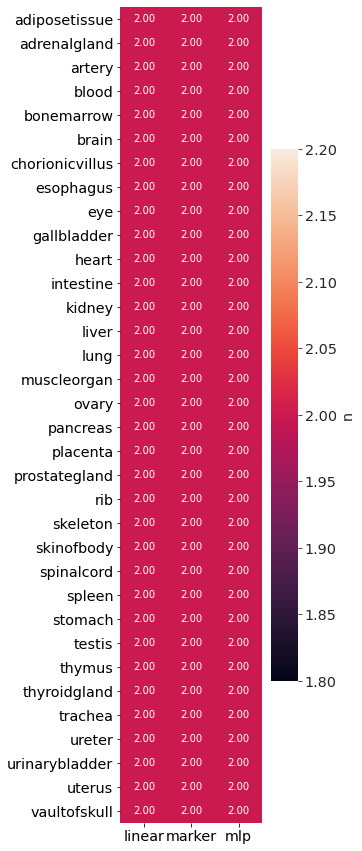

In [6]:
fig, axs = gs_celltype_cv.plot_completions()
fig = plt.gcf()
fig.set_size_inches(5,12)
plt.tight_layout()
plt.show()

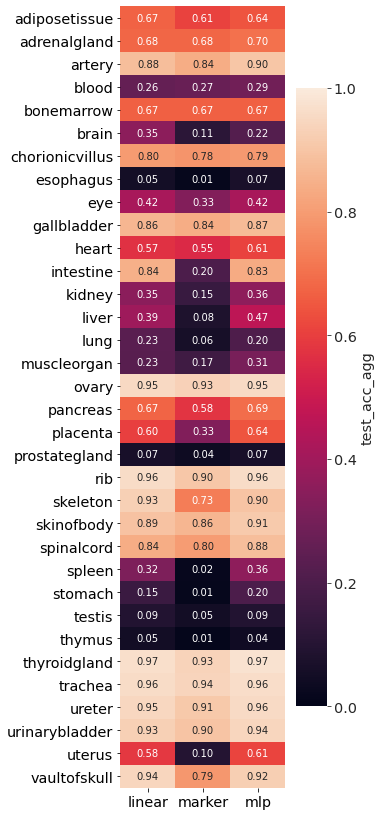

Min 0.008548153775336687
Max 0.9745877981185913
Mean 0.555660845095095
Median 0.6419282555580139


In [7]:
fig, axs, sns_data = gs_celltype_cv.plot_best(
    metric_select="acc_agg",
    partition_select="val",
    metric_show="acc_agg",
    partition_show="test",
    collapse_cv="mean"
)
plt.tight_layout()
fig = plt.gcf()
fig.set_size_inches(4,12)
plt.savefig(figdir + "human_celltype_acc.pdf", bbox_inches='tight')
plt.show()

print('Min', np.min(sns_data.values))
print('Max', np.max(sns_data.values))
print('Mean', np.mean(sns_data.values))
print('Median', np.median(sns_data.values))

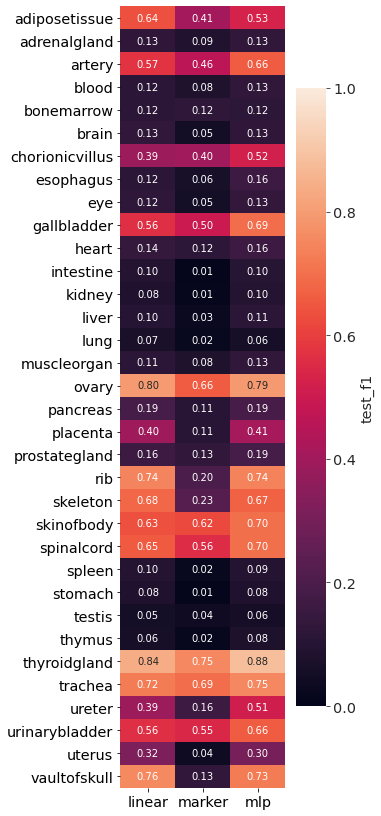

In [8]:
fig, axs, sns_data = gs_celltype_cv.plot_best(
    metric_select="custom_cce_agg",
    partition_select="val",
    metric_show="f1",
    partition_show="test",
    collapse_cv="mean"
)
plt.tight_layout()
fig = plt.gcf()
fig.set_size_inches(4,12)
plt.savefig(figdir + "human_celltype_f1.pdf", bbox_inches='tight')
plt.show()

Discovered mouse_placenta_2018_microwellseq_han_052.h5ad as .h5ad file.
Discovered mouse_thymus_2019_10xsequencing_pisco_034.h5ad as .h5ad file.
Discovered mouse_muscleorgan_2019_10xsequencing_pisco_026.h5ad as .h5ad file.
Discovered human_colonicepithelium_2019_10xsequencing_smilie_001.h5ad as .h5ad file.
Discovered human_testis_2018_10xsequencing_guo_001.h5ad as .h5ad file.
Discovered mouse_heart_2019_10xsequencing_pisco_015.h5ad as .h5ad file.
Discovered mouse_bonemarrow_2018_microwellseq_han_005.h5ad as .h5ad file.
Discovered mouse_blood_2018_microwellseq_han_048.h5ad as .h5ad file.
Discovered mouse_pancreas_2019_10xsequencing_thompson_001.h5ad as .h5ad file.
Discovered mouse_intestine_2018_microwellseq_han_010.h5ad as .h5ad file.
Discovered mouse_brain_2018_microwellseq_han_006.h5ad as .h5ad file.
Discovered mouse_blood_2018_microwellseq_han_050.h5ad as .h5ad file.
Discovered human_placenta_2018_smartseq2_ventotormo_002.h5ad as .h5ad file.
Discovered mouse_testis_2018_microwellseq

Discovered mouse_bonemarrow_2019_10xsequencing_pisco_008.h5ad as .h5ad file.
Discovered mouse_prostategland_2018_microwellseq_han_055.h5ad as .h5ad file.
Discovered mouse_testis_2018_microwellseq_han_064.h5ad as .h5ad file.
Discovered human_retina_2019_10xsequencing_voigt_001.h5ad as .h5ad file.
Discovered mouse_kidney_2019_smartseq2_pisco_019.h5ad as .h5ad file.
Discovered mouse_pancreas_2019_10xsequencing_thompson_002.h5ad as .h5ad file.
Discovered human_lung_2020_10xsequencing_miller_001.h5ad as .h5ad file.
Discovered human_blood_2019_10xsequencing_szabo_013.h5ad as .h5ad file.
Discovered human_rectum_2019_10xsequencing_wang_003.h5ad as .h5ad file.
Discovered mouse_lung_2018_microwellseq_han_014.h5ad as .h5ad file.
Discovered mouse_bonemarrow_2018_microwellseq_han_002.h5ad as .h5ad file.
Discovered human_lung_2019_10xsequencing_szabo_008.h5ad as .h5ad file.
Discovered mouse_brain_2019_smartseq2_pisco_010.h5ad as .h5ad file.
Discovered mouse_muscleorgan_2019_smartseq2_pisco_027.h5ad 

matched keys ['B cell', 'Bergmann glial cell', 'CD4-positive, alpha-beta T cell', 'CD8-positive, alpha-beta T cell', 'Hofbauer cell', 'Kupffer cell', 'Leydig cell', 'Mueller cell', 'Purkinje cell', 'Sertoli cell', 'T cell', 'abnormal cell', 'absorptive cell', 'acinar cell', 'alternatively activated macrophage', 'astrocyte', 'basal cell', 'bladder urothelial cell', 'cardiac muscle cell', 'cell of skeletal muscle', 'cholangiocyte', 'chondrocyte', 'chromaffin cell', 'ciliated cell', 'ciliated epithelial cell', 'club cell', 'conventional dendritic cell', 'cortical cell of adrenal gland', 'dendritic cell', 'effector T cell', 'embryonic stem cell', 'endocardial cell', 'endothelial cell', 'endothelial cell of artery', 'endothelial cell of hepatic sinusoid', 'endothelial cell of lymphatic vessel', 'endothelial cell of vascular tree', 'enterocyte', 'enteroendocrine cell', 'eosinophil', 'ependymal cell', 'epithelial cell', 'epithelial cell of cervix', 'epithelial cell of distal tubule', 'epithel

/mnt/home/icb/david.fischer/git/sfaira/sfaira/train/summaries.py:891: RuntimeWarning: invalid value encountered in true_divide
  precision = _tp(yhat, ytrue) / (_tp(yhat, ytrue) + _fp(yhat, ytrue))
/mnt/home/icb/david.fischer/git/sfaira/sfaira/train/summaries.py:892: RuntimeWarning: invalid value encountered in true_divide
  recall = _tp(yhat, ytrue) / (_tp(yhat, ytrue) + _fn(yhat, ytrue))
/mnt/home/icb/david.fischer/git/sfaira/sfaira/train/summaries.py:893: RuntimeWarning: divide by zero encountered in true_divide
  return 2 * 1 / (1 / precision + 1 / recall)
/mnt/home/icb/david.fischer/git/sfaira/sfaira/train/summaries.py:959: RuntimeWarning: Mean of empty slice
  hm[:, i] = np.nanmean(data_temp, axis=0)
<ipython-input-9-b59f3a3ef54e>:16: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


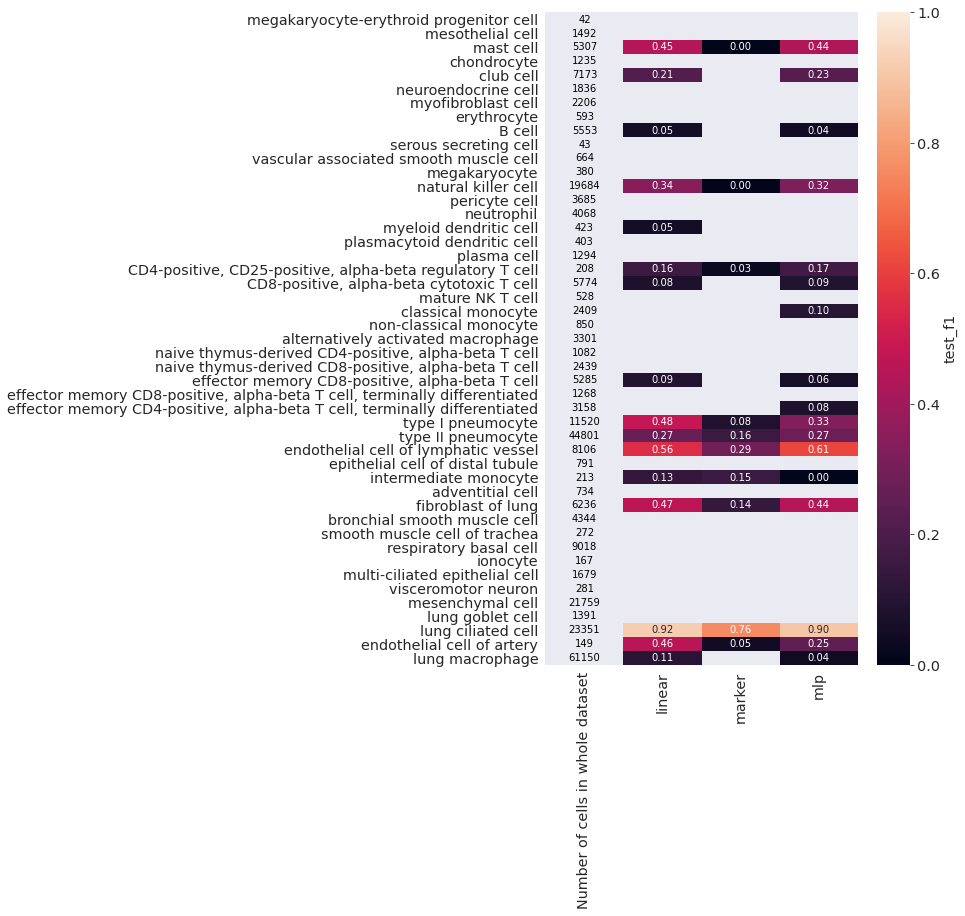

In [9]:
fig, axs, sns_data = gs_celltype_cv.plot_best_classwise_heatmap(
    organism="human",
    organ='lung',
    partition_select="val",
    metric_select="custom_cce_agg",
    metric_show="f1",
    collapse_cv="mean",
    height_fig=12,
    width_fig=7,
    min_cells=10,
    datapath=datadir,
    store_format="h5ad",
    targetpath=os.path.join(targetpath, "targets_human_lung.csv"),
    configpath=os.path.join(configpath, "config_human_lung.pickle"),
)
plt.tight_layout()
plt.savefig(figdir + "human_celltype_lung_celltypewise.pdf", bbox_inches='tight')

Discovered mouse_placenta_2018_microwellseq_han_052.h5ad as .h5ad file.
Discovered mouse_thymus_2019_10xsequencing_pisco_034.h5ad as .h5ad file.
Discovered mouse_muscleorgan_2019_10xsequencing_pisco_026.h5ad as .h5ad file.
Discovered human_colonicepithelium_2019_10xsequencing_smilie_001.h5ad as .h5ad file.
Discovered human_testis_2018_10xsequencing_guo_001.h5ad as .h5ad file.
Discovered mouse_heart_2019_10xsequencing_pisco_015.h5ad as .h5ad file.
Discovered mouse_bonemarrow_2018_microwellseq_han_005.h5ad as .h5ad file.
Discovered mouse_blood_2018_microwellseq_han_048.h5ad as .h5ad file.
Discovered mouse_pancreas_2019_10xsequencing_thompson_001.h5ad as .h5ad file.
Discovered mouse_intestine_2018_microwellseq_han_010.h5ad as .h5ad file.
Discovered mouse_brain_2018_microwellseq_han_006.h5ad as .h5ad file.
Discovered mouse_blood_2018_microwellseq_han_050.h5ad as .h5ad file.
Discovered human_placenta_2018_smartseq2_ventotormo_002.h5ad as .h5ad file.
Discovered mouse_testis_2018_microwellseq

Discovered mouse_bonemarrow_2019_10xsequencing_pisco_008.h5ad as .h5ad file.
Discovered mouse_prostategland_2018_microwellseq_han_055.h5ad as .h5ad file.
Discovered mouse_testis_2018_microwellseq_han_064.h5ad as .h5ad file.
Discovered human_retina_2019_10xsequencing_voigt_001.h5ad as .h5ad file.
Discovered mouse_kidney_2019_smartseq2_pisco_019.h5ad as .h5ad file.
Discovered mouse_pancreas_2019_10xsequencing_thompson_002.h5ad as .h5ad file.
Discovered human_lung_2020_10xsequencing_miller_001.h5ad as .h5ad file.
Discovered human_blood_2019_10xsequencing_szabo_013.h5ad as .h5ad file.
Discovered human_rectum_2019_10xsequencing_wang_003.h5ad as .h5ad file.
Discovered mouse_lung_2018_microwellseq_han_014.h5ad as .h5ad file.
Discovered mouse_bonemarrow_2018_microwellseq_han_002.h5ad as .h5ad file.
Discovered human_lung_2019_10xsequencing_szabo_008.h5ad as .h5ad file.
Discovered mouse_brain_2019_smartseq2_pisco_010.h5ad as .h5ad file.
Discovered mouse_muscleorgan_2019_smartseq2_pisco_027.h5ad 

matched keys ['B cell', 'Bergmann glial cell', 'CD4-positive, alpha-beta T cell', 'CD8-positive, alpha-beta T cell', 'Hofbauer cell', 'Kupffer cell', 'Leydig cell', 'Mueller cell', 'Purkinje cell', 'Sertoli cell', 'T cell', 'abnormal cell', 'absorptive cell', 'acinar cell', 'alternatively activated macrophage', 'astrocyte', 'basal cell', 'bladder urothelial cell', 'cardiac muscle cell', 'cell of skeletal muscle', 'cholangiocyte', 'chondrocyte', 'chromaffin cell', 'ciliated cell', 'ciliated epithelial cell', 'club cell', 'conventional dendritic cell', 'cortical cell of adrenal gland', 'dendritic cell', 'effector T cell', 'embryonic stem cell', 'endocardial cell', 'endothelial cell', 'endothelial cell of artery', 'endothelial cell of hepatic sinusoid', 'endothelial cell of lymphatic vessel', 'endothelial cell of vascular tree', 'enterocyte', 'enteroendocrine cell', 'eosinophil', 'ependymal cell', 'epithelial cell', 'epithelial cell of cervix', 'epithelial cell of distal tubule', 'epithel

/mnt/home/icb/david.fischer/git/sfaira/sfaira/train/summaries.py:84: RuntimeWarning: invalid value encountered in true_divide
  precision = _tp(yhat, ytrue) / (_tp(yhat, ytrue) + _fp(yhat, ytrue))
/mnt/home/icb/david.fischer/git/sfaira/sfaira/train/summaries.py:85: RuntimeWarning: invalid value encountered in true_divide
  recall = _tp(yhat, ytrue) / (_tp(yhat, ytrue) + _fn(yhat, ytrue))
/mnt/home/icb/david.fischer/git/sfaira/sfaira/train/summaries.py:86: RuntimeWarning: divide by zero encountered in true_divide
  return 2 * 1 / (1 / precision + 1 / recall)
/mnt/home/icb/david.fischer/git/sfaira/sfaira/train/summaries.py:1123: RuntimeWarning: Mean of empty slice
  hm[:, i] = np.nanmean(data_temp, axis=0)


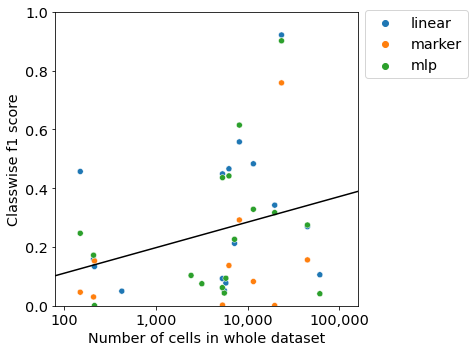

In [10]:
fig, axs, sns_data = gs_celltype_cv.plot_best_classwise_scatter(
    organism="human",
    organ='lung',
    partition_select="val",
    metric_select="custom_cce_agg",
    metric_show="f1",
    collapse_cv="mean",
    height_fig=6,
    width_fig=10,
    min_cells=10,
    annotate_thres_ncells=1000,
    annotate_thres_f1=1.0,
    datapath=datadir,
    store_format="h5ad",
    targetpath=os.path.join(targetpath, "targets_human_lung.csv"),
    configpath=os.path.join(configpath, "config_human_lung.pickle"),
)
plt.close()
sns_data['Number of cells in whole dataset'] = np.log10(sns_data['Number of cells in whole dataset'].values)

sns.scatterplot(x='Number of cells in whole dataset', y='Classwise f1 score', hue='Model type', data=sns_data)

x = sns_data['Number of cells in whole dataset'].values
y = sns_data['Classwise f1 score'].values
plt.plot(np.append(np.unique(x), 6), np.poly1d(np.polyfit(x[~np.isnan(y)], y[~np.isnan(y)], 1))(np.append(np.unique(x), 6)), color='k')

fig = plt.gcf()
fig.set_size_inches(5.8, 5)
ax = plt.gca()
ax.set_xlim((1.9,5.2))
ax.set_ylim((0.0,1.0))
ax.set_xticks(np.array([2, 3, 4, 5]))
ax.set_xticklabels(
    labels=[
        "10" if x == 1
        else "100" if x == 2
        else "1,000" if x == 3
        else "10,000" if x == 4
        else "100,000" if x == 5
        else "1,000,000" if x == 6
        else " "
        for x in ax.get_xticks()
    ]
);
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc='center left', bbox_to_anchor=(1, 0.89))
plt.tight_layout()
plt.savefig(figdir + "human_celltype_lung_celltypewise_scatter.pdf", bbox_inches='tight')
plt.show()

## Check learning

### Linear model

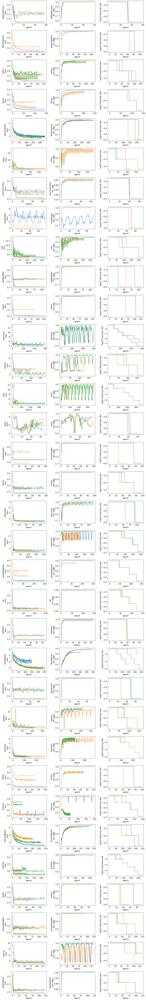

In [11]:
gs_celltype_cv.plot_training_history(
    partition_select="val",
    metric_select="acc_agg",
    metric_show="acc_agg",
    subset={"version": "0.0.1"},
    cv_key=None,
    log_loss=False
)
plt.savefig(figdir + "human_celltype_learning_linear.pdf")
plt.tight_layout()

### MLP model

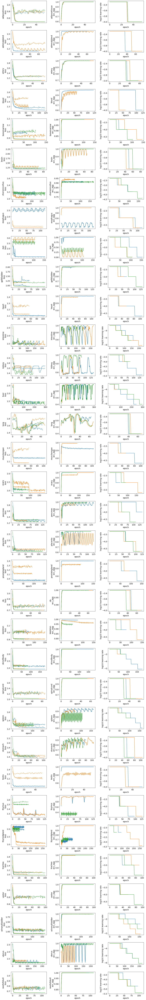

In [12]:
gs_celltype_cv.plot_training_history(
    partition_select="val",
    metric_select="acc_agg",
    metric_show="acc_agg",
    subset={"version": "0.1.1"},
    cv_key=None,
    log_loss=True
)
plt.savefig(figdir + "human_celltype_learning_mlp_011.pdf")
plt.tight_layout()

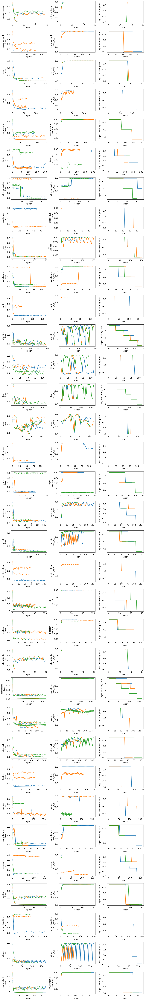

In [13]:
gs_celltype_cv.plot_training_history(
    partition_select="val",
    metric_select="acc_agg",
    metric_show="acc_agg",
    subset={"version": "0.1.2"},
    cv_key=None,
    log_loss=True
)
plt.savefig(figdir + "human_celltype_learning_mlp_012.pdf")
plt.tight_layout()

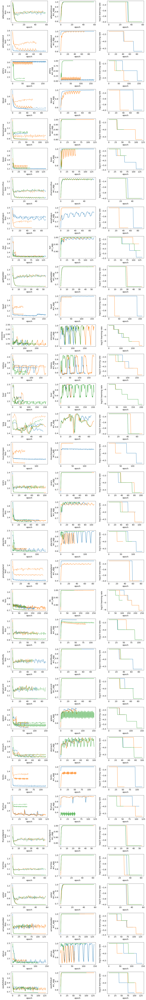

In [14]:
gs_celltype_cv.plot_training_history(
    partition_select="val",
    metric_select="acc_agg",
    metric_show="acc_agg",
    subset={"version": "0.1.3"},
    cv_key=None,
    log_loss=True
)
plt.savefig(figdir + "human_celltype_learning_mlp_013.pdf")
plt.tight_layout()

## Compare hyperparameters

### Linear model

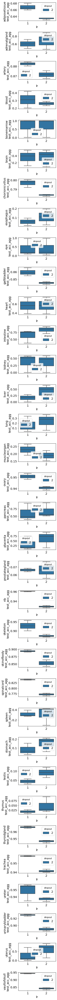

In [15]:
gs_celltype_cv.plot_best_model_by_hyperparam(
    partition_select="val",
    metric_select="acc_agg",
    param_hue="dropout",
    subset={"model_type": "linear"},
    param_x=['lr']
)
plt.savefig(figdir + "human_celltype_hyperparameters_linear.pdf")
plt.tight_layout()

### MLP model

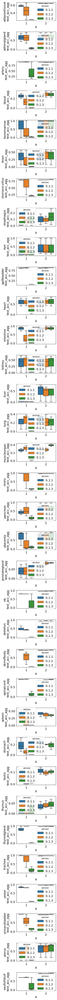

In [16]:
gs_celltype_cv.plot_best_model_by_hyperparam(
    partition_select="val",
    metric_select="acc_agg",
    param_hue="version",
    subset={"model_type": "mlp"},
    param_x=['lr']
)
plt.savefig(figdir + "human_celltype_hyperparameters_mlp.pdf")
plt.tight_layout()

# Embedding models

## Load GS

In [17]:
gs_embedding_cv = sfaira.train.SummarizeGridsearchEmbedding(
    source_path={
        "210509_AE_0.1_0.1_CV": grid_search_dir + 'HUMAN/EMBEDDING/',
        "210509_AE_0.2_0.1_CV": grid_search_dir + 'HUMAN/EMBEDDING/',
        "210509_AE_0.3_0.1_CV": grid_search_dir + 'HUMAN/EMBEDDING/',
        "210509_VAE_0.1_0.1_CV": grid_search_dir + 'HUMAN/EMBEDDING/',
        "210509_VAE_0.2_0.1_CV": grid_search_dir + 'HUMAN/EMBEDDING/',
        "210509_VAE_0.3_0.1_CV": grid_search_dir + 'HUMAN/EMBEDDING/',
        "210512_LINEAR_0.1_0.1_CV": grid_search_dir + 'HUMAN/EMBEDDING/',
        "210512_LINEAR_0.2_0.1_CV": grid_search_dir + 'HUMAN/EMBEDDING/',
        "210512_NMF_0.1_0.1_CV": grid_search_dir + 'HUMAN/EMBEDDING/',
        "210512_NMF_0.2_0.1_CV": grid_search_dir + 'HUMAN/EMBEDDING/',
        "210511_PCA_0.1_CV": grid_search_dir + 'HUMAN/EMBEDDING/',
    },
    cv=True
)
gs_embedding_cv.load_gs(
    gs_ids=[
        "210509_AE_0.1_0.1_CV",
        "210509_AE_0.2_0.1_CV",
        "210509_AE_0.3_0.1_CV",
        "210509_VAE_0.1_0.1_CV",
        "210509_VAE_0.2_0.1_CV",
        "210509_VAE_0.3_0.1_CV",
        "210512_LINEAR_0.1_0.1_CV",
        "210512_LINEAR_0.2_0.1_CV",
        "210512_NMF_0.1_0.1_CV",
        "210512_NMF_0.2_0.1_CV",
        "210511_PCA_0.1_CV",
    ]
)
gs_embedding_cv.create_summary_tab()

In [18]:
with open('gs_human_embedding_cv.pkl', 'wb') as f:
    pickle.dump(gs_embedding_cv, f, pickle.HIGHEST_PROTOCOL)

In [19]:
with open('gs_human_embedding_cv.pkl', 'rb') as f:
    gs_embedding_cv = pickle.load(f)

In [20]:
gs_embedding_cv.create_summary_tab()

## Summarize best models

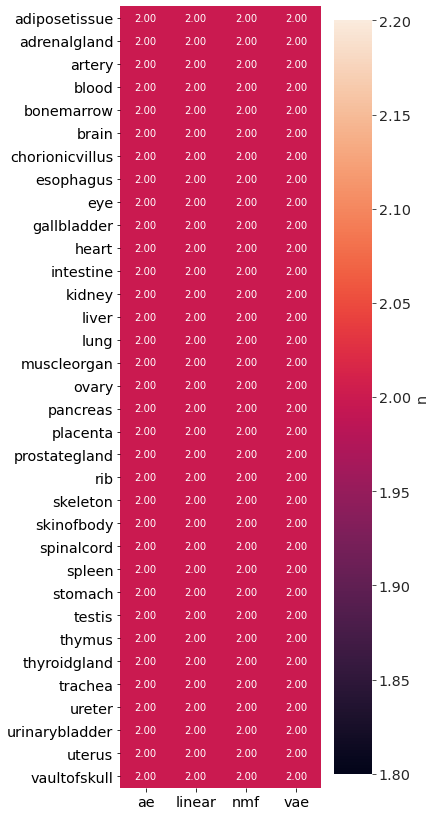

In [21]:
fig, axs = gs_embedding_cv.plot_completions()
plt.tight_layout()
fig = plt.gcf()
fig.set_size_inches((5,12))
plt.show()

In [ ]:
fig, axs, sns_data = gs_embedding_cv.plot_best(
    metric_select="custom_negll",
    partition_select="val",
    metric_show="custom_negll",
    partition_show="test",
    collapse_cv="mean"
)
plt.close()

# invert colour scale
fig, axs = plt.subplots(1, 1, figsize=(5, 12))
with sns.axes_style("dark"):
    axs = sns.heatmap(
        sns_data,
        annot=True, fmt=".2f",
        ax=axs,
        xticklabels=True, yticklabels=True,
        cbar_kws={'label': "test_custom_negll"},
        robust=True,
        cmap=sns.cm.rocket_r
    )

plt.tight_layout()
plt.savefig(figdir + "human_embedding_negll.pdf", bbox_inches='tight')
plt.show()

print('Min', np.min(sns_data.values, axis=0))
print('Max', np.max(sns_data.values, axis=0))
print('Mean', np.mean(sns_data.values, axis=0))
print('Median', np.median(sns_data.values, axis=0))

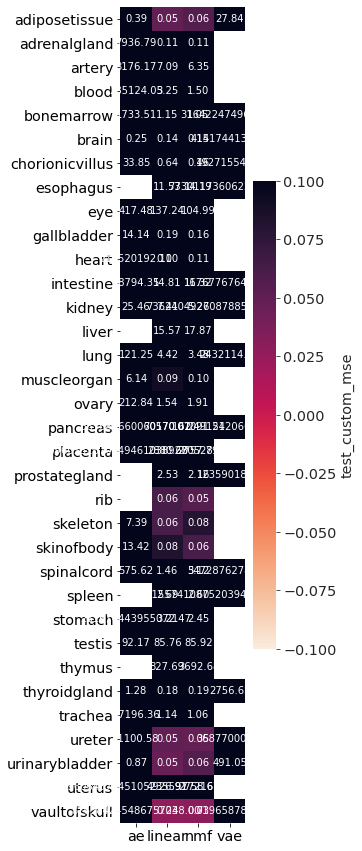

Min nan
Max nan
Mean nan
Median nan


In [23]:
fig, axs, sns_data = gs_embedding_cv.plot_best(
    metric_select="custom_mse",
    partition_select="val",
    metric_show="custom_mse",
    partition_show="test",
    collapse_cv="mean"
)
plt.close()

# invert colour scale
fig, axs = plt.subplots(1, 1, figsize=(5, 12))
with sns.axes_style("dark"):
    axs = sns.heatmap(
        sns_data,
        annot=True, fmt=".2f",
        ax=axs,
        xticklabels=True, yticklabels=True,
        cbar_kws={'label': "test_custom_mse"},
        robust=True,
        cmap=sns.cm.rocket_r
    )

plt.tight_layout()
plt.savefig(figdir + "human_embedding_mse.pdf", bbox_inches='tight')
plt.show()

print('Min', np.min(sns_data.values, axis=0))
print('Max', np.max(sns_data.values, axis=0))
print('Mean', np.mean(sns_data.values, axis=0))
print('Median', np.median(sns_data.values, axis=0))

## Check learning

### Linear model

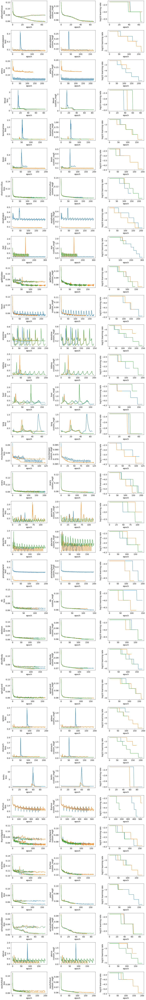

In [24]:
gs_embedding_cv.plot_training_history(
    partition_select="val",
    metric_select="custom_negll",
    metric_show="custom_negll",
    subset={"model_type": "linear", "version": "0.1"},
    cv_key=None,
    log_loss=False
)
plt.tight_layout()
plt.savefig(figdir + "human_embedding_learning_linear_01.pdf")

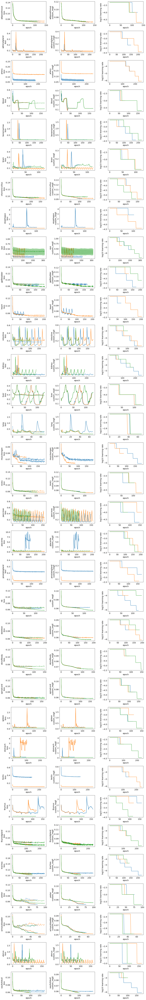

In [25]:
gs_embedding_cv.plot_training_history(
    partition_select="val",
    metric_select="custom_negll",
    metric_show="custom_negll",
    subset={"model_type": "linear", "version": "0.2"},
    cv_key=None,
    log_loss=False
)
plt.tight_layout()
plt.savefig(figdir + "human_embedding_learning_linear_02.pdf")

### AE model

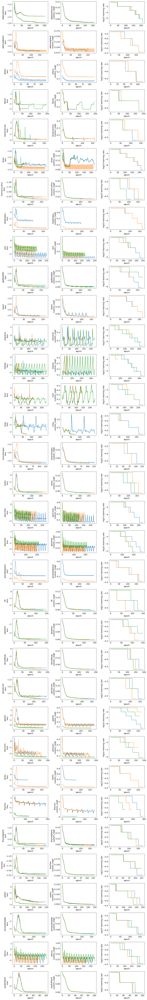

In [26]:
gs_embedding_cv.plot_training_history(
    partition_select="val",
    metric_select="custom_negll",
    metric_show="custom_negll",
    subset={"model_type": "ae", "version": "0.1"},
    cv_key=None,
    log_loss=True
)
plt.tight_layout()
plt.savefig(figdir + "human_embedding_learning_mlp_01.pdf")

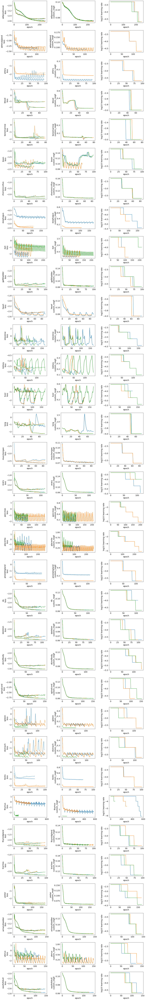

In [27]:
gs_embedding_cv.plot_training_history(
    partition_select="val",
    metric_select="custom_negll",
    metric_show="custom_negll",
    subset={"model_type": "ae", "version": "0.2"},
    cv_key=None,
    log_loss=True
)
plt.tight_layout()
plt.savefig(figdir + "mouse_embedding_learning_mlp_02.pdf")

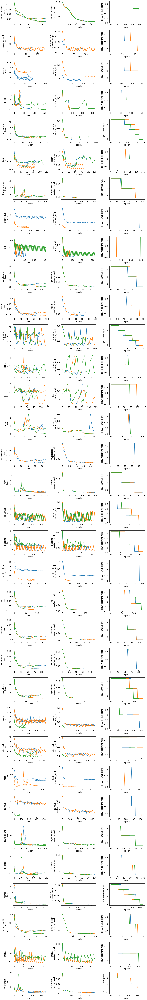

In [28]:
gs_embedding_cv.plot_training_history(
    partition_select="val",
    metric_select="custom_negll",
    metric_show="custom_negll",
    subset={"model_type": "ae", "version": "0.3"},
    cv_key=None,
    log_loss=True
)
plt.tight_layout()
plt.savefig(figdir + "human_embedding_learning_mlp_03.pdf")

## Compare hyperparameters

### Linear model

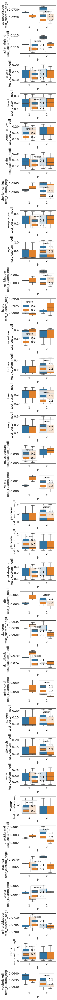

In [29]:
gs_embedding_cv.plot_best_model_by_hyperparam(
    partition_select="val",
    metric_select="custom_negll",
    param_hue="version",
    subset={"model_type": "linear"},
    param_x=['lr']
)
plt.tight_layout()
plt.savefig(figdir + "human_embedding_hyperparameteres_linear.pdf")

### AE model

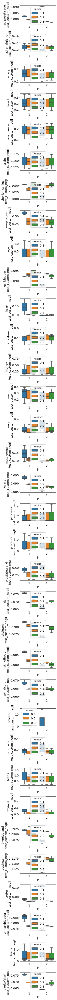

In [30]:
gs_embedding_cv.plot_best_model_by_hyperparam(
    partition_select="val",
    metric_select="custom_negll",
    param_hue="version",
    subset={"model_type": "ae"},
    param_x=['lr']
)
plt.tight_layout()
plt.savefig(figdir + "human_embedding_hyperparameteres_ae.pdf")

# Embedding models with random projection reference

In [31]:
model_id_len = 3
def create_summary_tab(evals):
    metrics = list(evals.values())[0].keys()
    summary_tab = pd.DataFrame(dict(
        list({
            "cv":            [id_i.split("_")[-1] for id_i in evals.keys()],  # noqa: E241
            "model":         ["_".join(id_i.split("_")[:model_id_len]) for id_i in evals.keys()],  # noqa: E241
            "organism":      [id_i.split("_")[1].split("-")[0] for id_i in evals.keys()],  # noqa: E241
            "organ":         [id_i.split("_")[1].split("-")[1] for id_i in evals.keys()],  # noqa: E241
            "model_type":    [id_i.split("_")[1].split("-")[2] for id_i in evals.keys()],  # noqa: E241
            "version":       [id_i.split("_")[1].split("-")[3] for id_i in evals.keys()],  # noqa: E241
            "model_gs_id":   ["_".join(id_i.split("_")[:(model_id_len + 6)]) for id_i in evals.keys()],  # noqa: E241
            "run":           evals.keys(),  # noqa: E241
        }.items()) +
        list(dict([(m, [evals[x][m] if m in evals[x].keys() else
                        evals[x]['neg_ll_' + m] for x in evals.keys()])
                   for m in metrics]).items())
    ))
    # TODO: Hacky solution to make sure metrics are called the same in VAE and other models
    rename_dict = {
        "train_neg_ll_custom_mse": "custom_mse",
        "train_neg_ll_custom_negll": "custom_negll",
    }
    summary_tab = summary_tab.rename(columns=rename_dict)
    return summary_tab

In [32]:
gs_embedding_linear_cv = sfaira.train.SummarizeGridsearchEmbedding(
    source_path={
        "210512_LINEAR_0.1_0.1_CV": grid_search_dir + 'HUMAN/EMBEDDING/',
        "210512_LINEAR_0.2_0.1_CV": grid_search_dir + 'HUMAN/EMBEDDING/',
    },
    cv=True
)
gs_embedding_linear_cv.load_gs(
    gs_ids=[
        "210512_LINEAR_0.1_0.1_CV",
        "210512_LINEAR_0.2_0.1_CV",
    ]
)
gs_embedding_linear_cv.create_summary_tab()

gs_embedding_rp_cv = sfaira.train.SummarizeGridsearchEmbedding(
    source_path={
        "210519_RP_0.1_CV": grid_search_dir + 'HUMAN/EMBEDDING/',
    },
    cv=True
)
gs_embedding_rp_cv.load_gs(
    gs_ids=[
        "210519_RP_0.1_CV",
    ]
)
tab_rp = create_summary_tab(evals=gs_embedding_rp_cv.evals)

file embedding_human-adiposetissue-rp-0.1-0.1_theislab_0_cv0_history.pickle not found
file embedding_human-adiposetissue-rp-0.1-0.1_theislab_0_cv0_hyperparam.pickle not found
file embedding_human-adiposetissue-rp-0.1-0.1_theislab_0_cv0_model_hyperparam.pickle not found
file embedding_human-adiposetissue-rp-0.1-0.1_theislab_0_cv1_history.pickle not found
file embedding_human-adiposetissue-rp-0.1-0.1_theislab_0_cv1_hyperparam.pickle not found
file embedding_human-adiposetissue-rp-0.1-0.1_theislab_0_cv1_model_hyperparam.pickle not found
file embedding_human-adiposetissue-rp-0.1-0.1_theislab_0_cv2_history.pickle not found
file embedding_human-adiposetissue-rp-0.1-0.1_theislab_0_cv2_hyperparam.pickle not found
file embedding_human-adiposetissue-rp-0.1-0.1_theislab_0_cv2_model_hyperparam.pickle not found
file embedding_human-adrenalgland-rp-0.1-0.1_theislab_0_cv0_history.pickle not found
file embedding_human-adrenalgland-rp-0.1-0.1_theislab_0_cv0_hyperparam.pickle not found
file embedding_hu

file embedding_human-liver-rp-0.1-0.1_theislab_0_cv2_hyperparam.pickle not found
file embedding_human-liver-rp-0.1-0.1_theislab_0_cv2_model_hyperparam.pickle not found
file embedding_human-lung-rp-0.1-0.1_theislab_0_cv0_history.pickle not found
file embedding_human-lung-rp-0.1-0.1_theislab_0_cv0_hyperparam.pickle not found
file embedding_human-lung-rp-0.1-0.1_theislab_0_cv0_model_hyperparam.pickle not found
file embedding_human-lung-rp-0.1-0.1_theislab_0_cv1_history.pickle not found
file embedding_human-lung-rp-0.1-0.1_theislab_0_cv1_hyperparam.pickle not found
file embedding_human-lung-rp-0.1-0.1_theislab_0_cv1_model_hyperparam.pickle not found
file embedding_human-lung-rp-0.1-0.1_theislab_0_cv2_history.pickle not found
file embedding_human-lung-rp-0.1-0.1_theislab_0_cv2_hyperparam.pickle not found
file embedding_human-lung-rp-0.1-0.1_theislab_0_cv2_model_hyperparam.pickle not found
file embedding_human-muscleorgan-rp-0.1-0.1_theislab_0_cv0_history.pickle not found
file embedding_huma

file embedding_human-stomach-rp-0.1-0.1_theislab_0_cv2_hyperparam.pickle not found
file embedding_human-stomach-rp-0.1-0.1_theislab_0_cv2_model_hyperparam.pickle not found
file embedding_human-testis-rp-0.1-0.1_theislab_0_cv0_history.pickle not found
file embedding_human-testis-rp-0.1-0.1_theislab_0_cv0_hyperparam.pickle not found
file embedding_human-testis-rp-0.1-0.1_theislab_0_cv0_model_hyperparam.pickle not found
file embedding_human-testis-rp-0.1-0.1_theislab_0_cv1_history.pickle not found
file embedding_human-testis-rp-0.1-0.1_theislab_0_cv1_hyperparam.pickle not found
file embedding_human-testis-rp-0.1-0.1_theislab_0_cv1_model_hyperparam.pickle not found
file embedding_human-thymus-rp-0.1-0.1_theislab_0_cv0_history.pickle not found
file embedding_human-thymus-rp-0.1-0.1_theislab_0_cv0_hyperparam.pickle not found
file embedding_human-thymus-rp-0.1-0.1_theislab_0_cv0_model_hyperparam.pickle not found
file embedding_human-thymus-rp-0.1-0.1_theislab_0_cv1_history.pickle not found
fi

Ttest_relResult(statistic=-4.937421072097029, pvalue=1.1089534954766003e-05)


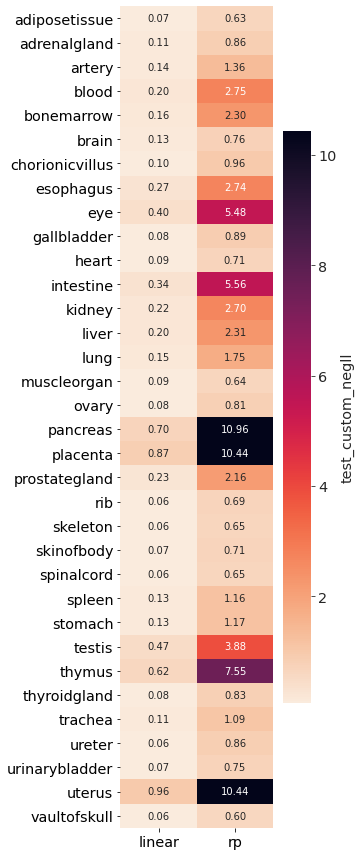

Min 0.057528880735238395
Max 10.956640172804654
Mean 1.402567469514319
Median 0.6435830071568627


In [33]:
# Add the mean performance of the RP model into the heatmap table.
# Note that there is no hyperparameter selection in the case of the RP model which is why it is handled outside
# of the summary class.
metric_show = "custom_negll"
fig, axs, sns_data = gs_embedding_linear_cv.plot_best(
    metric_select="custom_negll",
    partition_select="val",
    metric_show=metric_show,
    partition_show="test",
    collapse_cv="mean"
)
plt.close()
sns_data["rp"] = [np.mean(tab_rp.loc[tab_rp["organ"].values == x, metric_show]) for x in sns_data.index]

import scipy.stats
print(scipy.stats.ttest_rel(
    a=sns_data["linear"].values,
    b=sns_data["rp"].values,
    alternative="less",
))

# invert colour scale
fig, axs = plt.subplots(1, 1, figsize=(5, 12))
with sns.axes_style("dark"):
    axs = sns.heatmap(
        sns_data,
        annot=True, fmt=".2f",
        ax=axs,
        xticklabels=True, yticklabels=True,
        cbar_kws={'label': "test_custom_negll"},
        robust=True,
        cmap=sns.cm.rocket_r
    )

plt.tight_layout()
plt.savefig(figdir + "human_embedding_negll_rp.pdf", bbox_inches='tight')
plt.show()

print('Min', np.min(sns_data.values))
print('Max', np.max(sns_data.values))
print('Mean', np.mean(sns_data.values))
print('Median', np.median(sns_data.values))

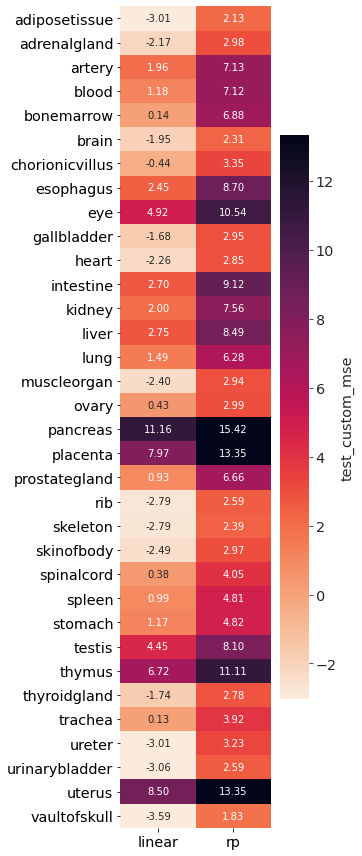

Min -3.5871563777622675
Max 15.416179581555324
Mean 3.342881071640961
Median 2.7636849536063126


In [34]:
# Add the mean performance of the RP model into the heatmap table.
# Note that there is no hyperparameter selection in the case of the RP model which is why it is handled outside
# of the summary class.
metric_show = "custom_mse"
fig, axs, sns_data = gs_embedding_linear_cv.plot_best(
    metric_select="custom_mse",
    partition_select="val",
    metric_show=metric_show,
    partition_show="test",
    collapse_cv="mean"
)
plt.close()
sns_data["rp"] = [np.mean(tab_rp.loc[tab_rp["organ"].values == x, metric_show]) for x in sns_data.index]
for k, v in sns_data.items():
    sns_data[k] = np.log(v)

# invert colour scale
fig, axs = plt.subplots(1, 1, figsize=(5, 12))
with sns.axes_style("dark"):
    axs = sns.heatmap(
        sns_data,
        annot=True, fmt=".2f",
        ax=axs,
        xticklabels=True, yticklabels=True,
        cbar_kws={'label': "test_custom_mse"},
        robust=True,
        cmap=sns.cm.rocket_r
    )

plt.tight_layout()
plt.show()

print('Min', np.min(sns_data.values))
print('Max', np.max(sns_data.values))
print('Mean', np.mean(sns_data.values))
print('Median', np.median(sns_data.values))

# Example embeddings

In [35]:
def plot_embedding(organ, cvs=0):
    model_id, embedding, covar = gs_embedding_cv.best_model_embedding(
        subset={"model_type": "nmf", "organ": organ},
        partition="val",
        metric="loss",
        cvs=[cvs],
    )
    if "id" not in covar[0].columns:
        covar[0]["id"] = ["_".join(x.split("_")[:7]) for x in covar[0]["Unnamed: 0"].values]
    adata = anndata.AnnData(embedding[0], obs=covar[0])
    sc.pp.neighbors(adata)
    sc.tl.umap(adata)
    sc.pl.umap(adata, color=["id"], save="_human_umap_holdout_"+organ+"_dataset.pdf")
    sc.pl.umap(adata, color=["cell_types_original"], save="_human_umap_holdout_"+organ+"_type.pdf")

/home/icb/david.fischer/miniconda3/envs/sfaira/lib/python3.8/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
... storing 'cell_ontology_class' as categorical
... storing 'cell_ontology_id' as categorical
... storing 'cell_types_original' as categorical
... storing 'assay_sc' as categorical
... storing 'disease' as categorical
... storing 'organ' as categorical
... storing 'organism' as categorical
... storing 'sample_source' as categorical
... storing 'id' as categorical


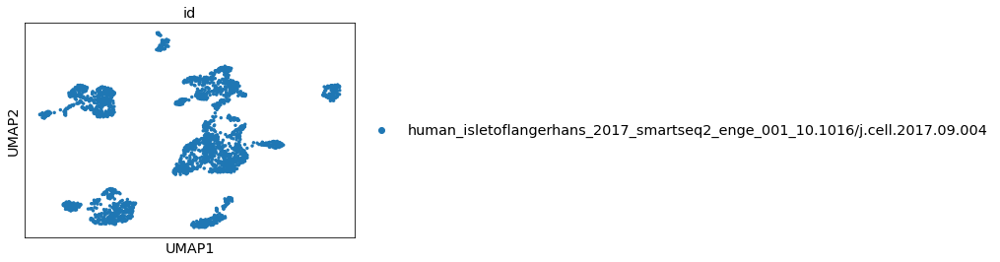

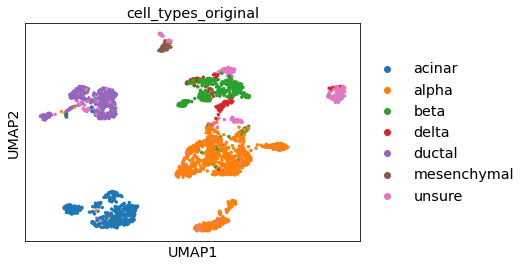

In [40]:
plot_embedding("pancreas", cvs=0)

/home/icb/david.fischer/miniconda3/envs/sfaira/lib/python3.8/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
... storing 'cell_ontology_class' as categorical
... storing 'cell_ontology_id' as categorical
... storing 'cell_types_original' as categorical
... storing 'assay_sc' as categorical
... storing 'bio_sample' as categorical
... storing 'development_stage' as categorical
... storing 'organ' as categorical
... storing 'organism' as categorical
... storing 'sex' as categorical
... storing 'state_exact' as categorical
... storing 'sample_source' as categorical
... storing 'id' as categorical


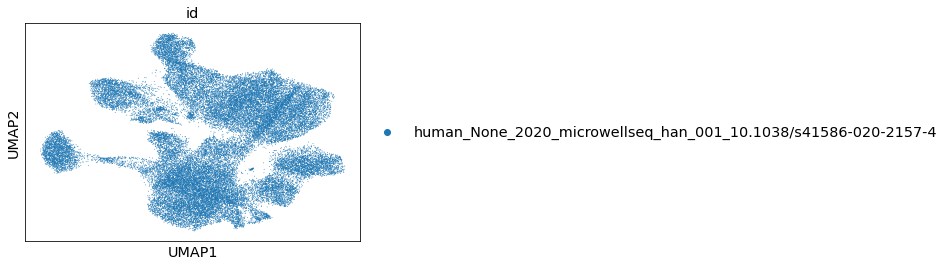

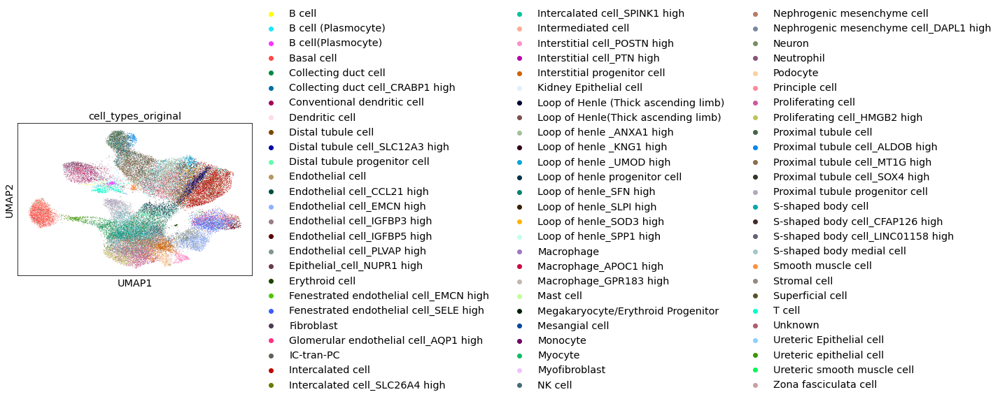

In [38]:
plot_embedding("kidney", cvs=1)